In [1]:
!pip install kaggle

In [32]:
!mkdir .kaggle

mkdir: cannot create directory ‘.kaggle’: File exists


In [0]:
import json

In [0]:
token={"username":"akshaylucof","key":"2ba90f5960ccb38c72cb2615892af210"}

In [0]:
with open('/content/.kaggle/kaggle.json', 'w') as file:
    json.dump(token, file)

In [0]:
!cp /content/.kaggle/kaggle.json ~/.kaggle/kaggle.json

In [38]:
!kaggle config set -n path -v{/content}

- path is now set to: {/content}


In [0]:
!chmod 600 /root/.kaggle/kaggle.json

In [40]:
!kaggle competitions download -c dog-breed-identification

  0% 0.00/11.4k [00:00<?, ?B/s]
100% 11.4k/11.4k [00:00<00:00, 19.3MB/s]
  0% 0.00/60.9k [00:00<?, ?B/s]
100% 60.9k/60.9k [00:00<00:00, 58.0MB/s]
  0% 0.00/43.7k [00:00<?, ?B/s]
100% 43.7k/43.7k [00:00<00:00, 45.9MB/s]
  0% 0.00/25.0k [00:00<?, ?B/s]
100% 25.0k/25.0k [00:00<00:00, 26.0MB/s]
  0% 0.00/20.2k [00:00<?, ?B/s]
100% 20.2k/20.2k [00:00<00:00, 17.2MB/s]
  0% 0.00/32.3k [00:00<?, ?B/s]
100% 32.3k/32.3k [00:00<00:00, 36.6MB/s]
  0% 0.00/68.1k [00:00<?, ?B/s]
100% 68.1k/68.1k [00:00<00:00, 61.7MB/s]
  0% 0.00/28.4k [00:00<?, ?B/s]
100% 28.4k/28.4k [00:00<00:00, 29.2MB/s]
  0% 0.00/18.3k [00:00<?, ?B/s]
100% 18.3k/18.3k [00:00<00:00, 19.0MB/s]
  0% 0.00/66.5k [00:00<?, ?B/s]
100% 66.5k/66.5k [00:00<00:00, 73.3MB/s]
  0% 0.00/15.3k [00:00<?, ?B/s]
100% 15.3k/15.3k [00:00<00:00, 13.3MB/s]
  0% 0.00/48.5k [00:00<?, ?B/s]
100% 48.5k/48.5k [00:00<00:00, 50.1MB/s]
  0% 0.00/6.71k [00:00<?, ?B/s]
100% 6.71k/6.71k [00:00<00:00, 7.05MB/s]
  0% 0.00/24.6k [00:00<?, ?B/s]
100% 24.6k/24.6k [0

In [13]:
!unzip /content/{/content}/datasets/slothkong/10-monkey-species/10-monkey-species.zip -d /content

Archive:  /content/{/content}/datasets/slothkong/10-monkey-species/10-monkey-species.zip
  inflating: /content/monkey_labels.txt  
  inflating: /content/training/training/n0/n0018.jpg  
  inflating: /content/training/training/n0/n0019.jpg  
  inflating: /content/training/training/n0/n0020.jpg  
  inflating: /content/training/training/n0/n0021.jpg  
  inflating: /content/training/training/n0/n0022.jpg  
  inflating: /content/training/training/n0/n0023.jpg  
  inflating: /content/training/training/n0/n0024.jpg  
  inflating: /content/training/training/n0/n0025.jpg  
  inflating: /content/training/training/n0/n0026.jpg  
  inflating: /content/training/training/n0/n0027.jpg  
  inflating: /content/training/training/n0/n0028.jpg  
  inflating: /content/training/training/n0/n0029.jpg  
  inflating: /content/training/training/n0/n0030.jpg  
  inflating: /content/training/training/n0/n0031.jpg  
  inflating: /content/training/training/n0/n0032.jpg  
  inflating: /content/training/training/n0/n

In [14]:
from keras.applications.resnet50 import ResNet50
img_rows, img_cols = 224, 224 
ResNet = ResNet50(weights='imagenet',include_top = False,input_shape = (img_rows, img_cols, 3))

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


94658560/94653016 [==============================] - 7s 0us/step


In [16]:
for layer in ResNet.layers:
    layer.trainable = False
    
# Let's print our layers 
for (i,layer) in enumerate(ResNet.layers):
    print(str(i) + " "+ layer.__class__.__name__, layer.trainable)

0 InputLayer False
1 ZeroPadding2D False
2 Conv2D False
3 BatchNormalization False
4 Activation False
5 ZeroPadding2D False
6 MaxPooling2D False
7 Conv2D False
8 BatchNormalization False
9 Activation False
10 Conv2D False
11 BatchNormalization False
12 Activation False
13 Conv2D False
14 Conv2D False
15 BatchNormalization False
16 BatchNormalization False
17 Add False
18 Activation False
19 Conv2D False
20 BatchNormalization False
21 Activation False
22 Conv2D False
23 BatchNormalization False
24 Activation False
25 Conv2D False
26 BatchNormalization False
27 Add False
28 Activation False
29 Conv2D False
30 BatchNormalization False
31 Activation False
32 Conv2D False
33 BatchNormalization False
34 Activation False
35 Conv2D False
36 BatchNormalization False
37 Add False
38 Activation False
39 Conv2D False
40 BatchNormalization False
41 Activation False
42 Conv2D False
43 BatchNormalization False
44 Activation False
45 Conv2D False
46 Conv2D False
47 BatchNormalization False
48 BatchNor

In [0]:
def addTopModelResNet(bottom_model, num_classes):
    """creates the top or head of the model that will be 
    placed ontop of the bottom layers"""

    top_model = bottom_model.output
    top_model = GlobalAveragePooling2D()(top_model)
    top_model = Dense(1024,activation='relu')(top_model)
    top_model=Dropout(.3)(top_model)
    top_model = Dense(1024,activation='relu')(top_model)
    top_model=BatchNormalization()(top_model)
    top_model=Dropout(.3)(top_model)
    top_model = Dense(512,activation='relu')(top_model)
    top_model=BatchNormalization()(top_model)
    top_model=Dropout(.3)(top_model)
    top_model = Dense(256,activation='relu')(top_model)
    top_model = Dense(num_classes,activation='softmax')(top_model)
    return top_model

In [28]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, GlobalAveragePooling2D
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D
from keras.layers.normalization import BatchNormalization
from keras.models import Model

# Set our class number to 3 (Young, Middle, Old)
num_classes = 10

FC_Head = addTopModelResNet(ResNet, num_classes)

model = Model(inputs = ResNet.input, outputs = FC_Head)

print(model.summary())

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
____________________________________________________________________________________________

In [29]:
from keras.preprocessing.image import ImageDataGenerator

train_data_dir = '/content/training/training'
validation_data_dir = '/content/validation/validation'

# Let's use some data augmentaiton 
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=45,
      width_shift_range=0.3,
      height_shift_range=0.3,
      horizontal_flip=True,
      fill_mode='nearest')
 
validation_datagen = ImageDataGenerator(rescale=1./255)
 
# set our batch size (typically on most mid tier systems we'll use 16-32)
batch_size = 32
 
train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_rows, img_cols),
        batch_size=batch_size,
        class_mode='categorical')
 
validation_generator = validation_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_rows, img_cols),
        batch_size=batch_size,
        class_mode='categorical')

Found 1098 images belonging to 10 classes.
Found 272 images belonging to 10 classes.


In [31]:
from keras.optimizers import RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping

                     
checkpoint = ModelCheckpoint("/content/monkey_breed_ResNet.h5",
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)

earlystop = EarlyStopping(monitor = 'val_loss', 
                          min_delta = 0, 
                          patience = 3,
                          verbose = 1,
                          restore_best_weights = True)

# we put our call backs into a callback list
callbacks = [earlystop, checkpoint]

# We use a very small learning rate 
model.compile(loss = 'categorical_crossentropy',
              optimizer = RMSprop(lr = 0.001),
              metrics = ['accuracy'])

# Enter the number of training and validation samples here
nb_train_samples = 1097
nb_validation_samples = 272

# We only train 5 EPOCHS 
epochs = 10
batch_size = 16

history = model.fit_generator(
    train_generator,
    steps_per_epoch = nb_train_samples // batch_size,
    epochs = epochs,
    callbacks = callbacks,
    validation_data = validation_generator,
    validation_steps = nb_validation_samples // batch_size)

Epoch 1/10
68/68 [==============================] - 94s 1s/step - loss: 1.3256 - accuracy: 0.5746 - val_loss: 3.3202 - val_accuracy: 0.1136

Epoch 00001: val_loss improved from inf to 3.32019, saving model to /content/monkey_breed_ResNet.h5
Epoch 2/10
68/68 [==============================] - 91s 1s/step - loss: 0.7000 - accuracy: 0.7838 - val_loss: 6.1132 - val_accuracy: 0.0918

Epoch 00002: val_loss did not improve from 3.32019
Epoch 3/10
68/68 [==============================] - 90s 1s/step - loss: 0.5493 - accuracy: 0.8208 - val_loss: 4.7286 - val_accuracy: 0.1016

Epoch 00003: val_loss did not improve from 3.32019
Epoch 4/10
68/68 [==============================] - 88s 1s/step - loss: 0.4913 - accuracy: 0.8471 - val_loss: 3.9758 - val_accuracy: 0.0918
Restoring model weights from the end of the best epoch

Epoch 00004: val_loss did not improve from 3.32019
Epoch 00004: early stopping


In [0]:
from keras.models import load_model

classifier = load_model('/content/monkey_breed_ResNet.h5')

Class - bald_uakari


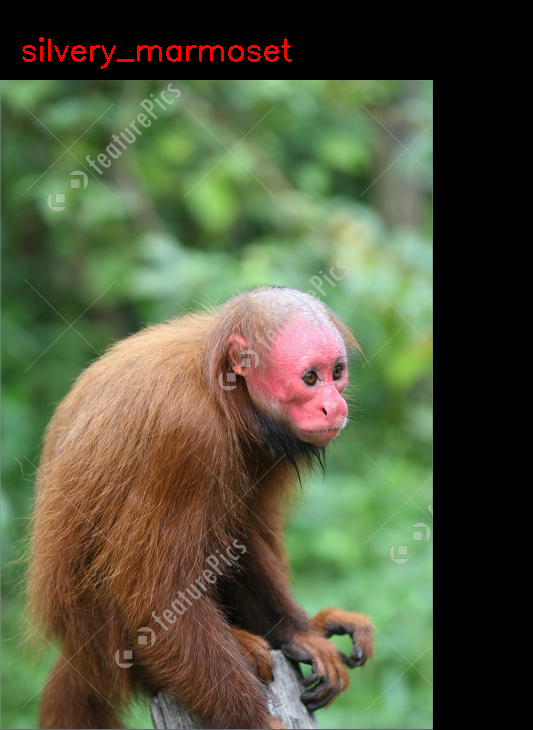

Class - common_squirrel_monkey


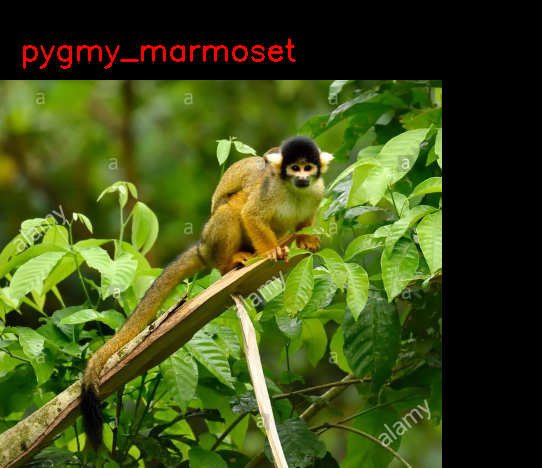

Class - pygmy_marmoset 


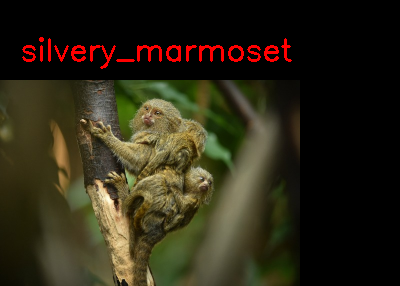

Class - pygmy_marmoset 


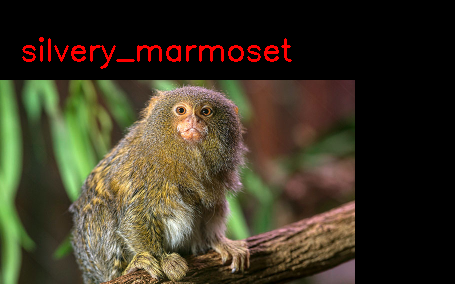

Class - patas_monkey


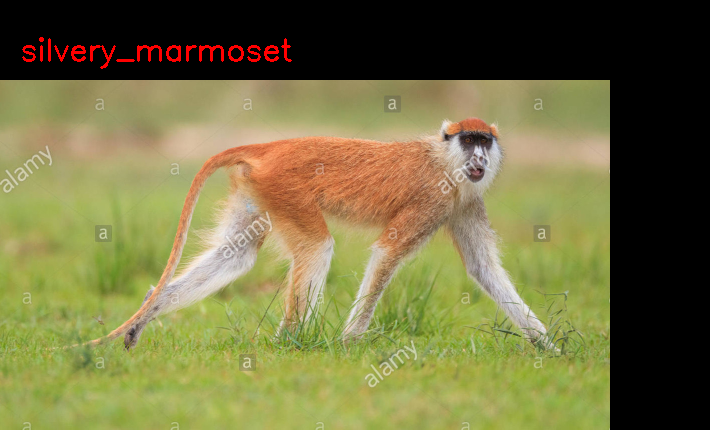

Class - patas_monkey


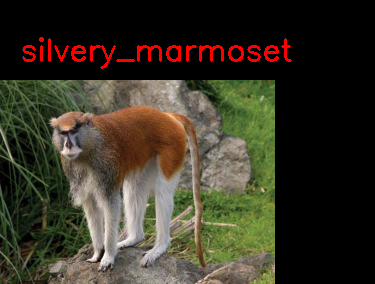

Class - nilgiri_langur


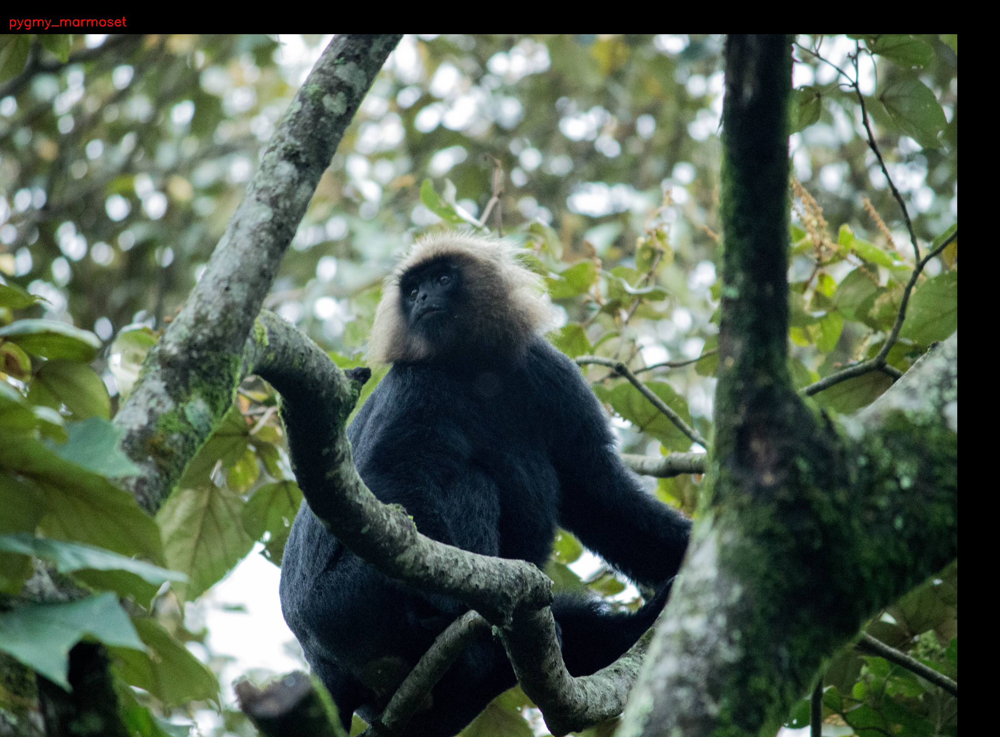

Class - mantled_howler 


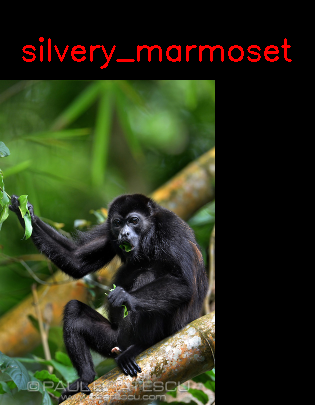

Class - silvery_marmoset


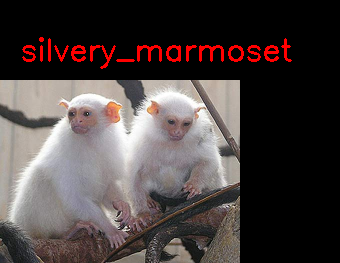

Class - nilgiri_langur


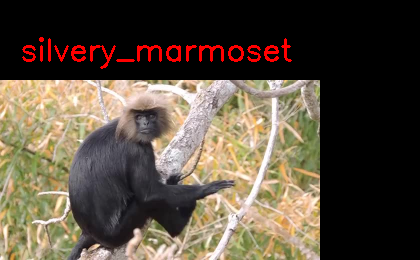

In [25]:
%matplotlib inline
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os
import cv2
import numpy as np
from os import listdir
from os.path import isfile, join

monkey_breeds_dict = {"[0]": "mantled_howler ", 
                      "[1]": "patas_monkey",
                      "[2]": "bald_uakari",
                      "[3]": "japanese_macaque",
                      "[4]": "pygmy_marmoset ",
                      "[5]": "white_headed_capuchin",
                      "[6]": "silvery_marmoset",
                      "[7]": "common_squirrel_monkey",
                      "[8]": "black_headed_night_monkey",
                      "[9]": "nilgiri_langur"}

monkey_breeds_dict_n = {"n0": "mantled_howler ", 
                      "n1": "patas_monkey",
                      "n2": "bald_uakari",
                      "n3": "japanese_macaque",
                      "n4": "pygmy_marmoset ",
                      "n5": "white_headed_capuchin",
                      "n6": "silvery_marmoset",
                      "n7": "common_squirrel_monkey",
                      "n8": "black_headed_night_monkey",
                      "n9": "nilgiri_langur"}

def draw_test(name, pred, im):
    monkey = monkey_breeds_dict[str(pred)]
    BLACK = [0,0,0]
    expanded_image = cv2.copyMakeBorder(im, 80, 0, 0, 100 ,cv2.BORDER_CONSTANT,value=BLACK)
    cv2.putText(expanded_image, monkey, (20, 60) , cv2.FONT_HERSHEY_SIMPLEX,1, (0,0,255), 2)
    cv2_imshow(expanded_image)

def getRandomImage(path):
    """function loads a random images from a random folder in our test path """
    folders = list(filter(lambda x: os.path.isdir(os.path.join(path, x)), os.listdir(path)))
    random_directory = np.random.randint(0,len(folders))
    path_class = folders[random_directory]
    print("Class - " + monkey_breeds_dict_n[str(path_class)])
    file_path = path +"/"+ path_class
    file_names = [f for f in listdir(file_path) if isfile(join(file_path, f))]
    random_file_index = np.random.randint(0,len(file_names))
    image_name = file_names[random_file_index]
    return cv2.imread(file_path+"/"+image_name)    

for i in range(0,10):
    input_im = getRandomImage("/content/validation/validation")
    input_original = input_im.copy()
    input_original = cv2.resize(input_original, None, fx=0.5, fy=0.5, interpolation = cv2.INTER_LINEAR)
    
    input_im = cv2.resize(input_im, (224, 224), interpolation = cv2.INTER_LINEAR)
    input_im = input_im / 255.
    input_im = input_im.reshape(1,224,224,3) 
    
    # Get Prediction
    res = np.argmax(classifier.predict(input_im, 1, verbose = 0), axis=1)
    
    # Show image with predicted class
    draw_test("Prediction", res, input_original) 
    cv2.waitKey(0)

cv2.destroyAllWindows()